In [1]:
%matplotlib inline

In [2]:
import os
import pandas as pd

from milvus_retriever import milvus_retriever
from car_manual_bot import car_manual_generator

/Users/yj/.pyenv/versions/3.9.11/envs/myMechanic_py39/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
os.environ["LANGCHAIN_TRACING_V2"]="true"
os.environ["LANGCHAIN_ENDPOINT"]="https://api.smith.langchain.com"
os.environ["LANGCHAIN_API_KEY"]="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"
os.environ["LANGCHAIN_PROJECT"]="my-small_mechanic"

milvus_host = 'localhost'#os.environ["MILVUS_HOST"]
milvus_port = os.environ["MILVUS_PORT"]

DB_COLLECTION_NAME = "TEST"
OPENAI_API_KEY = os.environ['OPENAI_API_KEY']
NAMESPACE_TYPE = ["IONIQ5_2024", "SANTAFE_MX5_2024", "SONATA_DN8_2024"]
NAMESPACE = NAMESPACE_TYPE[0]


In [4]:
sparse_params = {"drop_ratio_search": 0.01}
dense_params = {"ef": 100}

In [5]:
text_generator = car_manual_generator(OPENAI_API_KEY, NAMESPACE, milvus_host, milvus_port, DB_COLLECTION_NAME, 10, rrk_weight=(0, 1),
                                      score_filter=True, threshold=0.3, drop_duplicates=True, context_path='/Users/yj/Kim/1.work/SKR/8.GenAI/my-small-mechanic/pdf_context')

/Users/yj/.pyenv/versions/3.9.11/envs/myMechanic_py39/lib/python3.9/site-packages/langchain_core/_api/deprecation.py:119: LangChainDeprecationWarning: The class `ChatOpenAI` was deprecated in LangChain 0.0.10 and will be removed in 0.3.0. An updated version of the class exists in the langchain-openai package and should be used instead. To use it run `pip install -U langchain-openai` and import as `from langchain_openai import ChatOpenAI`.
  warn_deprecated(


In [5]:
qaset = pd.read_parquet('qaset/prediection_240508_gpt35_xmlcontext.parquet')

In [6]:
origin_document = pd.read_parquet('../../중간파일/IONIQ5_2024_embeddings_pc_chunking.parquet')

In [6]:
query = '안전벨트는 어떻게 사용해야 하나요?'
reduce_answer, context_answer, context_bag, docs, scores =  text_generator.generate_answer(query)

2024-06-07 11:12:16,382 [INFO] Start searching DB
2024-06-07 11:12:17,112 [INFO] Start Rerank
2024-06-07 11:12:18,243 [INFO] Rerank retry 1..
2024-06-07 11:12:29,373 [INFO] Rerank retry 2..
2024-06-07 11:12:49,437 [INFO] End Rerank
2024-06-07 11:12:49,444 [INFO] End searching DB
2024-06-07 11:12:49,445 [INFO] Start map query
2024-06-07 11:12:54,629 [INFO] End map query
2024-06-07 11:12:54,641 [INFO] Start reducing Context


안전벨트를 사용할 때는 엉덩이를 좌석에 깊게 걸치고 등을 등받이에 똑바로 기대고 앉아야 합니다. 안전벨트의 골반띠는 골반을 지나고, 어깨띠는 가슴을 지나야 합니다. 플레이트와 벨트를 잡아 천천히 당기고 '찰칵' 소리가 날 때까지 플레이트를 버클에 밀어 넣어야 합니다. 벨트를 너무 느슨하게 착용하지 않도록 주의해야 합니다.벨트의 어깨 높이를 조절할 수 있으며, 몸에 맞게 조절해야 합니다. 해제할 때는 버클에 있는 해제 버튼을 누른 상태에서 플레이트를 당겨 빼야 합니다.모든 좌석의 탑승자들은 가까운 거리라도 주행 전에 반드시 안전벨트를 착용해야 합니다.

2024-06-07 11:12:58,932 [INFO] 
End reducing Context


FileNotFoundError: [Errno 2] No such file or directory: '/Users/yj/Kim/1.work/SKR/8.GenAI/skr-mechanic-bot/pdf_context/image/IONIQ5_2024/113_5_img.jpeg'

2024-06-03 06:21:30,579 [INFO] Start searching DB
2024-06-03 06:21:30,914 [INFO] Start Rerank
2024-06-03 06:21:31,648 [INFO] End Rerank
2024-06-03 06:21:31,654 [INFO] End searching DB
2024-06-03 06:21:31,655 [INFO] Start map query
2024-06-03 06:21:33,050 [INFO] End map query
2024-06-03 06:21:33,075 [INFO] Start reducing Context


헤드레스트를 끝까지 올린 후 잠금 해제 버튼을 누른 상태에서 헤드레스트를 위로 올려 분리하면 됩니다.

2024-06-03 06:21:34,424 [INFO] 
End reducing Context


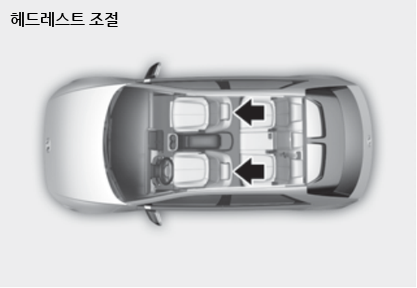

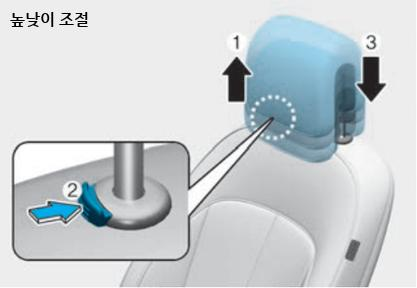

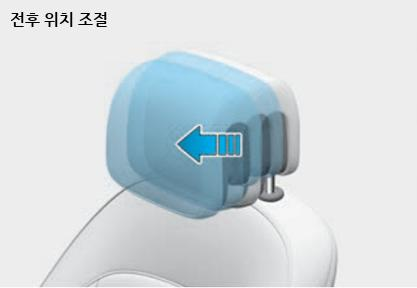

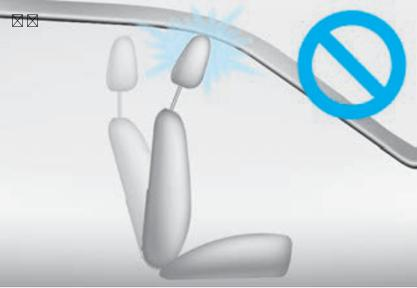

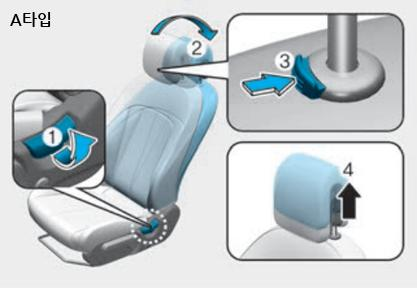

...

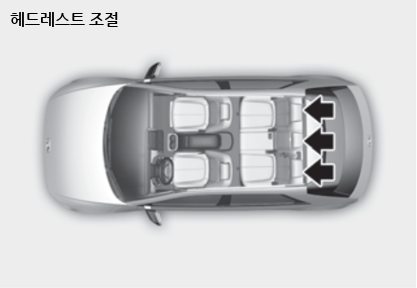

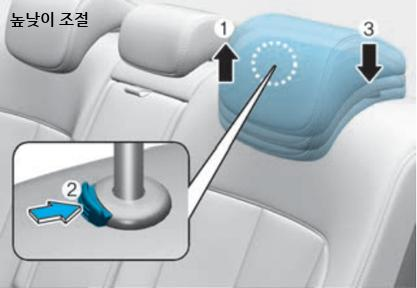

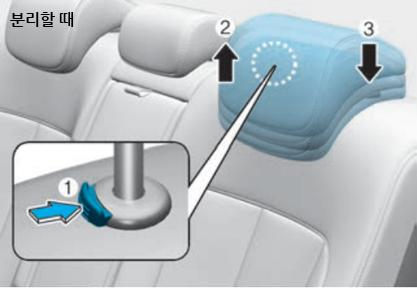

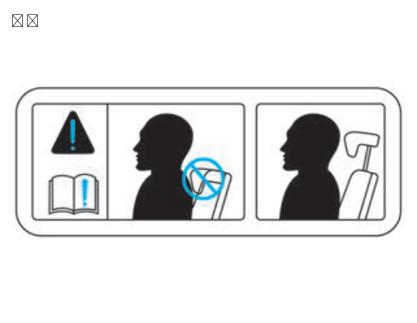

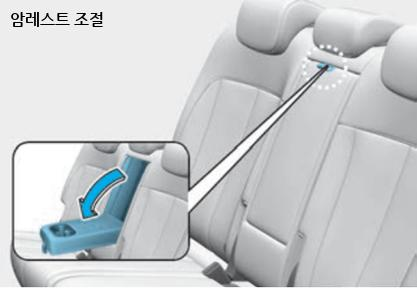

In [9]:
query = '헤드레스트 분리는 어떻게 하나요?'
reduce_answer, context_answer, context_bag, docs, scores =  text_generator.generate_answer(query)

2024-06-03 06:21:46,061 [INFO] Start searching DB
2024-06-03 06:21:46,535 [INFO] Start Rerank
2024-06-03 06:21:53,470 [INFO] End Rerank
2024-06-03 06:21:53,476 [INFO] End searching DB
2024-06-03 06:21:53,477 [INFO] Start map query
2024-06-03 06:21:57,363 [INFO] End map query
2024-06-03 06:21:57,385 [INFO] Start reducing Context


헤드레스트 분리할 때는 먼저 헤드레스트를 끝까지 올린 후 잠금 해제 버튼을 누른 상태에서 헤드레스트를 위로 올려 분리하면 됩니다. A타입과 B타입으로 나뉘어져 있으며, A타입은 등받이 각도 조절 레버 또는 스위치를 사용해 좌석 등받이를 뒤로 젖힌 후 헤드레스트를 분리하면 되고, B타입은 등받이 각도 조절 레버 또는 스위치를 사용해 좌석 등받이를 뒤로 젖힌 후 헤드레스트를 분리하면 됩니다.

2024-06-03 06:22:03,728 [INFO] 
End reducing Context


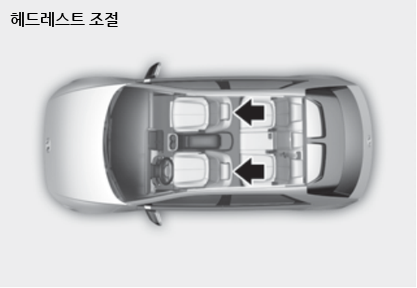

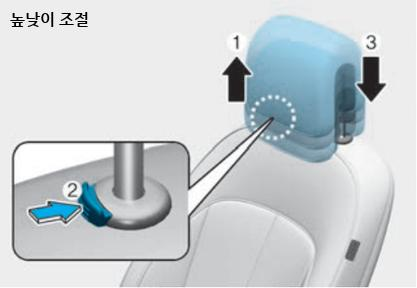

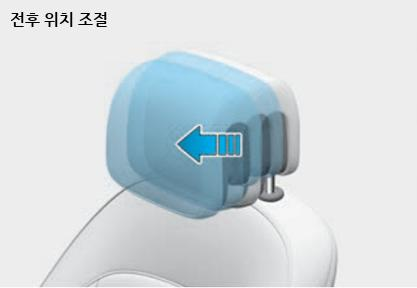

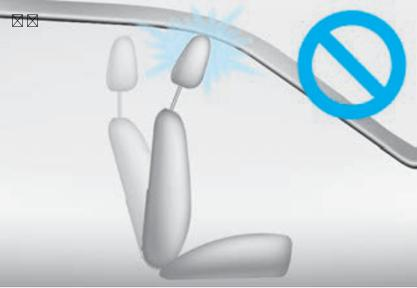

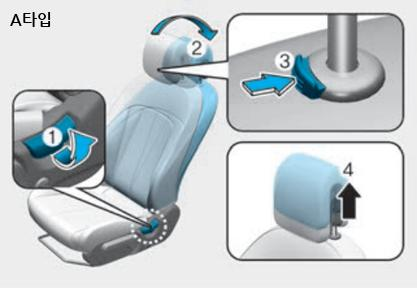

...

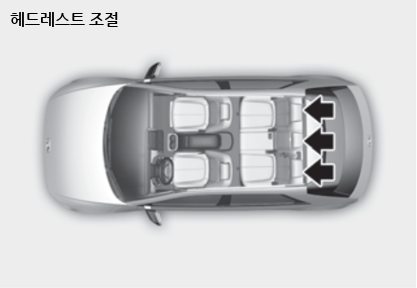

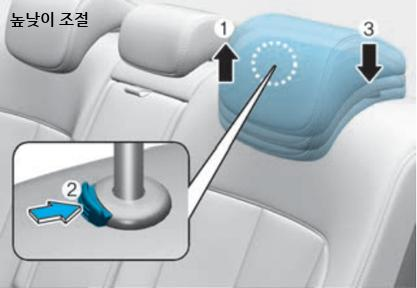

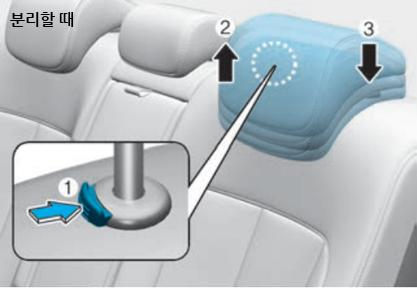

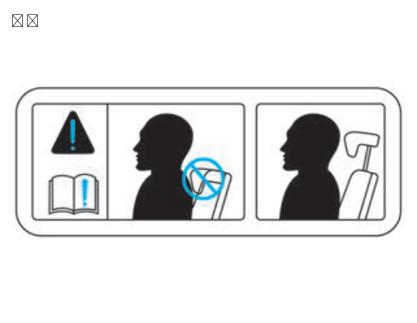

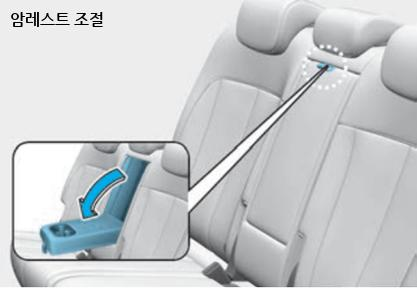

In [10]:
query = '헤드레스트 분리는 어떻게 하나요? 자세히 알려주세요'
reduce_answer, context_answer, context_bag, docs, scores =  text_generator.generate_answer(query)

2024-06-03 06:22:55,520 [INFO] Start searching DB
2024-06-03 06:22:56,036 [INFO] Start Rerank
2024-06-03 06:22:59,955 [INFO] End Rerank
2024-06-03 06:22:59,961 [INFO] End searching DB
2024-06-03 06:22:59,963 [INFO] Start map query
2024-06-03 06:23:06,146 [INFO] End map query
2024-06-03 06:23:06,169 [INFO] Start reducing Context


충돌방지가 작동하지 않는 경우는 인식 센서나 주변 환경에 이상이 있을 때 발생할 수 있습니다. 예를 들어, 인식 센서나 주변부가 오염되거나 파손되었을 경우, 외부 환경으로 인해 전방 카메라 주위 온도가 높거나 낮을 경우, 전방 카메라의 렌즈 앞에 선팅 필름, 발수 코팅, 파손, 이물질이 있을 경우, 앞 유리에 습기가 제거되지 않거나 얼어 있을 경우, 와셔 액 지속 분사 및 와이퍼 작동할 경우, 눈이나 비가 많이 오거나 안개가 짙을 경우, 역광으로 전방 카메라의 시야 확보가 어려울 경우 등이 있습니다. 이러한 상황에서는 전방 충돌방지가 제대로 반응하지 않거나 예기치 않은 작동이 발생할 수 있으므로 운전자의 주의가 필요합니다.

2024-06-03 06:23:11,611 [INFO] 
End reducing Context


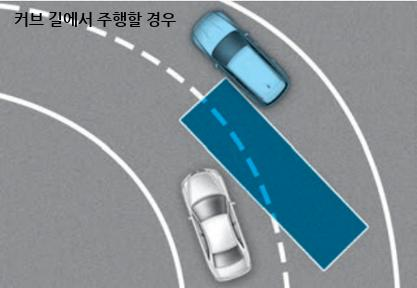

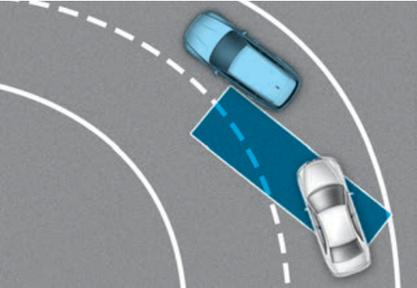

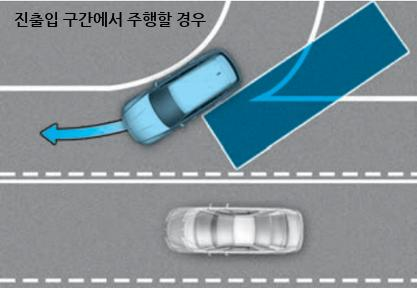

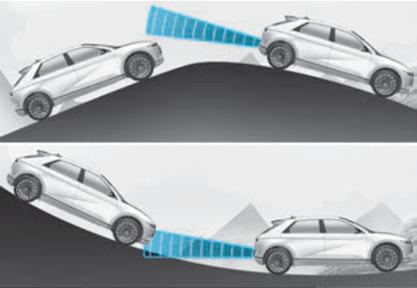

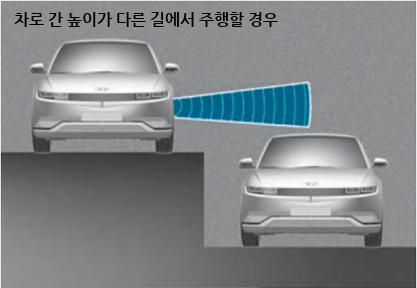

...

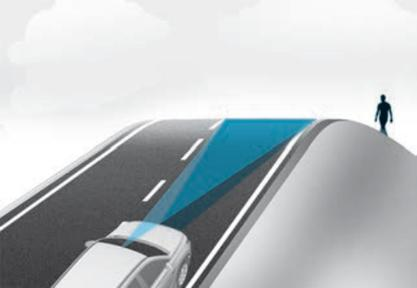

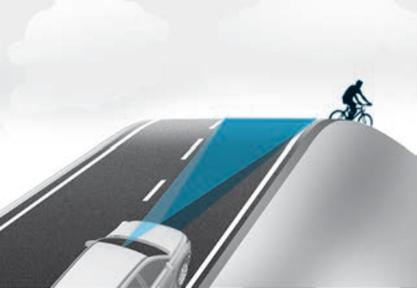

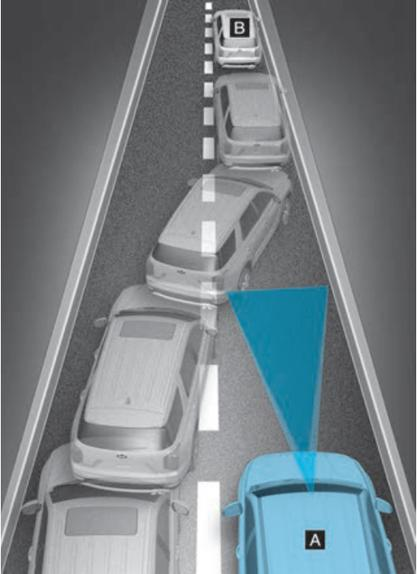

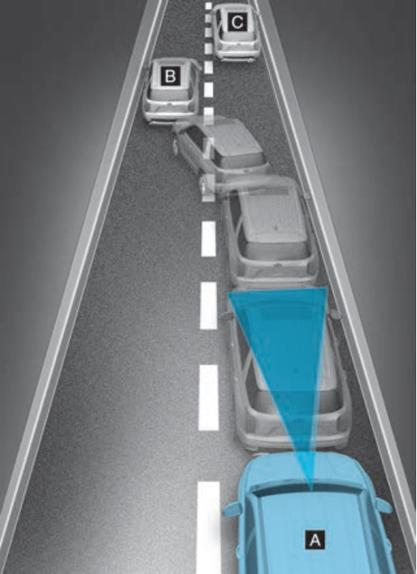

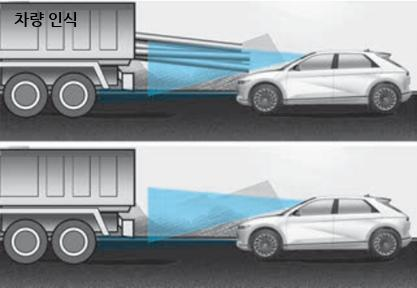

In [12]:
query = '충돌방지가 작동하지 않는 경우를 자세하게 알려주세요'
reduce_answer, context_answer, context_bag, docs, scores =  text_generator.generate_answer(query)

2024-06-03 06:48:33,758 [INFO] Start searching DB
2024-06-03 06:48:34,238 [INFO] Start Rerank
2024-06-03 06:48:34,970 [INFO] End Rerank
2024-06-03 06:48:34,978 [INFO] End searching DB
2024-06-03 06:48:34,979 [INFO] Start map query
2024-06-03 06:48:44,274 [INFO] End map query
2024-06-03 06:48:44,299 [INFO] Start reducing Context


정기 점검이 필요한 차량 항목 부품은 다음과 같습니다:

1. 감속기오일 (매 120,000km 교환)
2. 일반냉각수량 점검 및 교환
3. 저전도냉각수량 점검 및 교환
4. 각종 오일 누유, 냉각장치의 누수 여부
5. 보조배터리(12V) 터미널 조임 상태 점검
6. 보조배터리(12V) 터미널 녹 발생 점검
7. 드라이브샤프트와 부트
8. 휠너트의 조임상태
9. 브레이크페달 유격
10. 현가장치 점검 (볼트 및 너트 조임 토크)
11. 볼조인트류 점검 (로워암, 스텝바 링크)

2024-06-03 06:48:57,591 [INFO] 
End reducing Context


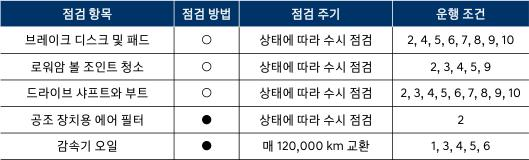

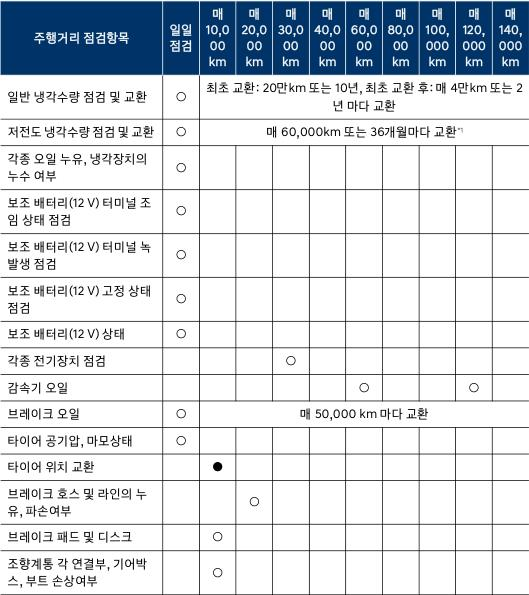

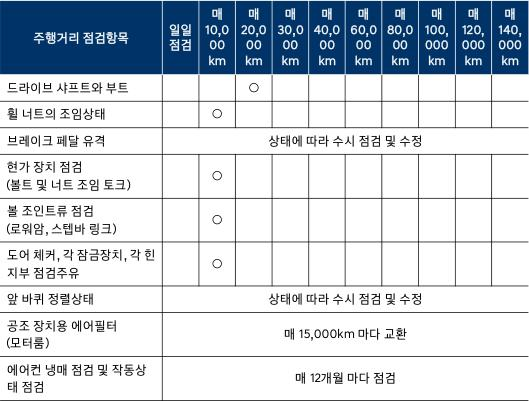

In [12]:
text_generator = car_manual_generator(OPENAI_API_KEY, NAMESPACE, milvus_host, milvus_port, DB_COLLECTION_NAME, 10, llm_model="gpt-3.5-turbo", rrk_weight=(0.3,0.7),
                 score_filter=True, threshold=0.3, drop_duplicates=True, pandas_llm_model="gpt-4-turbo", reduce_model="gpt-4-turbo",
                 map_text_model="gpt-3.5-turbo")

query = '정기 점검이 필요한 차량 항목 부품은 무엇이 있나요? 모두 알려주세요'
reduce_answer, context_answer, context_bag, docs, scores =  text_generator.generate_answer(query)

In [13]:
context_answer

{'context0': '모든 항목을 알려드릴 수는 없습니다.',
 'context1': '주어진 표에 따르면, 정기 점검이 필요한 차량 항목 부품은 "감속기오일"입니다. 이 항목은 "매120,000km교환"으로 명시되어 있어 정기적인 점검 및 교환이 필요함을 나타냅니다. 다른 항목들은 "상태에 따라 수시 점검"이 필요하다고 되어 있어, 정기적인 점검이 필요한지는 명확하지 않습니다.',
 'context2': '주어진 표에 따르면, 정기 점검이 필요한 차량 항목 부품은 다음과 같습니다:\n\n1. 일반냉각수량 점검 및 교환\n2. 저전도냉각수량 점검 및 교환\n3. 각종 오일 누유, 냉각장치의 누수 여부\n4. 보조배터리(12V) 터미널 조임 상태 점검\n5. 보조배터리(12V) 터미널 녹 발생 점검\n\n이들은 모두 정기적인 점검이 필요한 부품으로 표에 나타나 있습니다.',
 'context3': '주어진 표에 따르면, 정기 점검이 필요한 차량 항목 부품은 다음과 같습니다:\n\n1. 드라이브샤프트와부트\n2. 휠너트의조임상태\n3. 브레이크페달유격\n4. 현가장치점검(볼트및너트조임토크)\n5. 볼조인트류점검(로워암,스텝바링크)'}

In [25]:
pd.read_csv('../' + context_bag['table_csv_urls'][0])

,점검 항목,점검 방법,점검 주기,운행 조건
0,브레이크디스크및패드,○,상태에따라수시점검,"2,4,5,6,7,8,9,10"
1,로워암볼조인트청소,○,상태에따라수시점검,"2,3,4,5,9"
2,드라이브샤프트와부트,○,상태에따라수시점검,"2,3,4,5,6,7,8,9,10"
3,공조장치용에어필터,●,상태에따라수시점검,이미지 참조
4,감속기오일,●,"매120,000km교환","1,3,4,5,6"


In [26]:
pd.read_csv('../' + context_bag['table_csv_urls'][1])

,주행거리 점검항목,일일점검,"매10,000km","매20,000km","매30,000km","매40,000km","매60,000km","매80,000km","매100,000km","매120,000km","매140,000km"
0,일반냉각수량점검및교환,○,"최초교환:20만km또는10년,최초교환후:매4만km또는2년마다교환","최초교환:20만km또는10년,최초교환후:매4만km또는2년마다교환","최초교환:20만km또는10년,최초교환후:매4만km또는2년마다교환","최초교환:20만km또는10년,최초교환후:매4만km또는2년마다교환","최초교환:20만km또는10년,최초교환후:매4만km또는2년마다교환","최초교환:20만km또는10년,최초교환후:매4만km또는2년마다교환","최초교환:20만km또는10년,최초교환후:매4만km또는2년마다교환","최초교환:20만km또는10년,최초교환후:매4만km또는2년마다교환","최초교환:20만km또는10년,최초교환후:매4만km또는2년마다교환"
1,저전도냉각수량점검및교환,○,"매60,000km또는36개월마다교환*1","매60,000km또는36개월마다교환*1","매60,000km또는36개월마다교환*1","매60,000km또는36개월마다교환*1","매60,000km또는36개월마다교환*1","매60,000km또는36개월마다교환*1","매60,000km또는36개월마다교환*1","매60,000km또는36개월마다교환*1","매60,000km또는36개월마다교환*1"
2,"각종오일누유,냉각장치의누수여부",○,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,보조배터리(12V)터미널조임상태점검,○,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,보조배터리(12V)터미널녹발생점검,○,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,보조배터리(12V)고정상태점검,○,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,보조배터리(12V)상태,○,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,각종전기장치점검,NaN,NaN,NaN,○,NaN,NaN,NaN,NaN,NaN,NaN
8,감속기오일,NaN,NaN,NaN,NaN,NaN,○,NaN,NaN,○,NaN
9,브레이크오일,○,"매50,000km마다교환","매50,000km마다교환","매50,000km마다교환","매50,000km마다교환","매50,000km마다교환","매50,000km마다교환","매50,000km마다교환","매50,000km마다교환","매50,000km마다교환"


In [27]:
pd.read_csv('../' + context_bag['table_csv_urls'][2])

,주행거리 점검항목,일일점검,"매10,000km","매20,000km","매30,000km","매40,000km","매60,000km","매80,000km","매100,000km","매120,000km","매140,000km"
0,드라이브샤프트와부트,○,○,○,○,○,○,○,○,○,○
1,휠너트의조임상태,○,○,○,○,○,○,○,○,○,○
2,브레이크페달유격,상태에따라수시점검및수정,상태에따라수시점검및수정,상태에따라수시점검및수정,상태에따라수시점검및수정,상태에따라수시점검및수정,상태에따라수시점검및수정,상태에따라수시점검및수정,상태에따라수시점검및수정,상태에따라수시점검및수정,상태에따라수시점검및수정
3,현가장치점검(볼트및너트조임토크),NaN,○,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"볼조인트류점검(로워암,스텝바링크)",NaN,○,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,"도어체커,각잠금장치,각힌지부점검주유",NaN,○,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,앞바퀴정렬상태,상태에따라수시점검및수정,상태에따라수시점검및수정,상태에따라수시점검및수정,상태에따라수시점검및수정,상태에따라수시점검및수정,상태에따라수시점검및수정,상태에따라수시점검및수정,상태에따라수시점검및수정,상태에따라수시점검및수정,상태에따라수시점검및수정
7,공조장치용에어필터(모터룸),"매15,000km마다교환","매15,000km마다교환","매15,000km마다교환","매15,000km마다교환","매15,000km마다교환","매15,000km마다교환","매15,000km마다교환","매15,000km마다교환","매15,000km마다교환","매15,000km마다교환"
8,에어컨냉매점검및작동상태점검,매12개월마다점검,매12개월마다점검,매12개월마다점검,매12개월마다점검,매12개월마다점검,매12개월마다점검,매12개월마다점검,매12개월마다점검,매12개월마다점검,매12개월마다점검


2024-06-03 06:26:59,799 [INFO] Start searching DB
2024-06-03 06:27:00,271 [INFO] Start Rerank
2024-06-03 06:27:08,095 [INFO] End Rerank
2024-06-03 06:27:08,102 [INFO] End searching DB
2024-06-03 06:27:08,103 [INFO] Start map query
2024-06-03 06:27:09,807 [INFO] End map query
2024-06-03 06:27:09,838 [INFO] Start reducing Context


도어 잠금, 도어 잠금 해제, 파워 테일게이트 열림/닫힘, 비상경보(알람), 원격 시동, 충전 도어 열림/닫힘, 전진/후진 (사양 적용 시)입니다.

2024-06-03 06:27:11,946 [INFO] 
End reducing Context


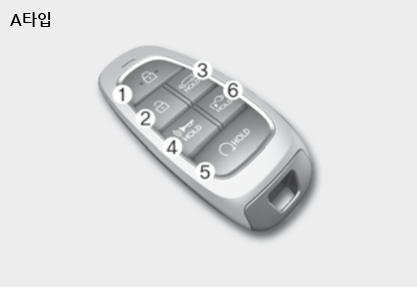

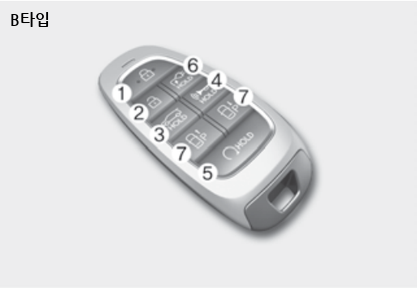

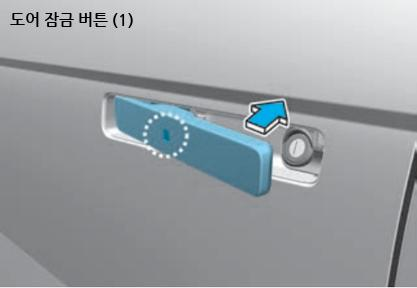

In [9]:
query = '스마트키의 주요 기능을 알려주세요'
reduce_answer, context_answer, context_bag, docs, scores =  text_generator.generate_answer(query)

2024-06-03 06:27:39,011 [INFO] Start searching DB
2024-06-03 06:27:39,504 [INFO] Start Rerank
2024-06-03 06:27:52,799 [INFO] End Rerank
2024-06-03 06:27:52,805 [INFO] End searching DB
2024-06-03 06:27:52,806 [INFO] Start map query
2024-06-03 06:27:56,341 [INFO] End map query
2024-06-03 06:27:56,371 [INFO] Start reducing Context


차로 이탈방지 보조가 제한되는 경우는 차로가 오염되거나 불명확한 경우, 노면이 젖는 등 차로와 도로의 색상 구분이 충분치 못한 경우, 차로 근처에 차선 외의 흔적이 있거나 차선과 유사한 표시가 있는 경우, 차로가 분명하지 않거나 훼손된 경우, 중앙분리대, 가드레일, 소음벽, 주변 잡목 등 도로 주변 물체의 그림자가 차로를 덮는 경우 등입니다.

2024-06-03 06:27:59,390 [INFO] 
End reducing Context


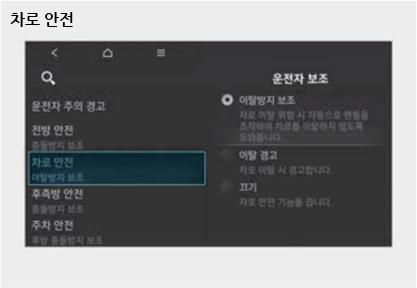

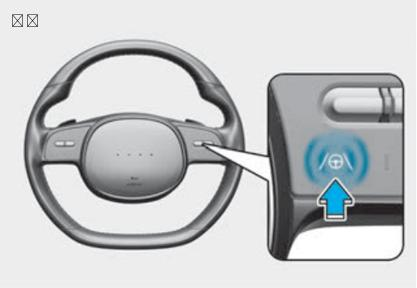

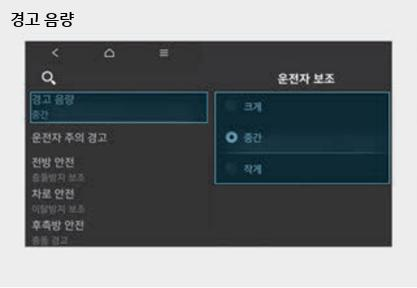

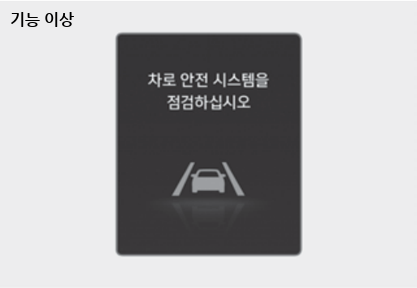

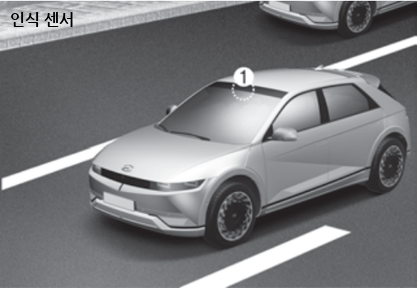

...

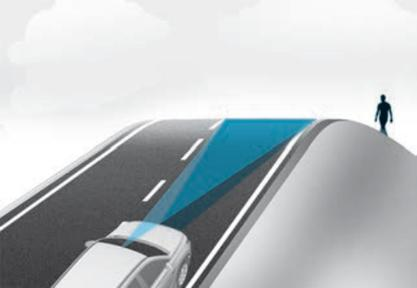

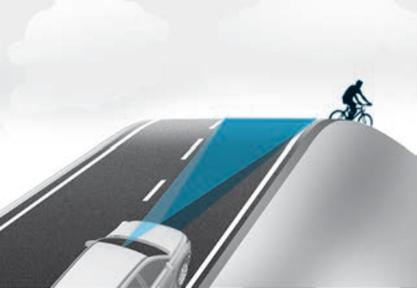

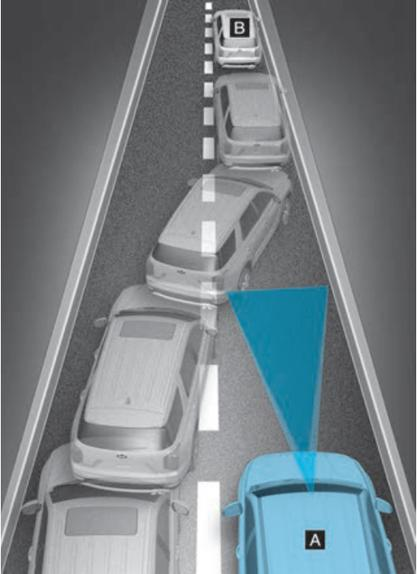

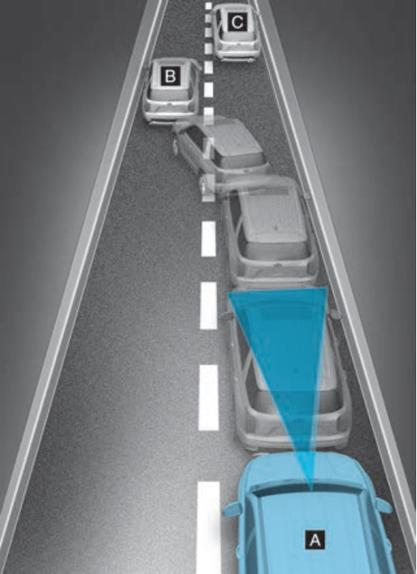

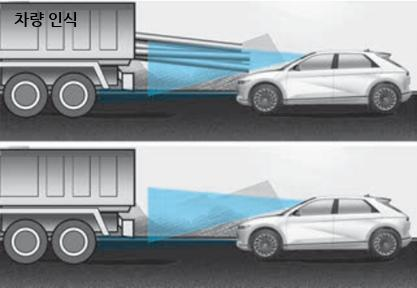

In [10]:
query = '차로 이탈방지 보조가 제한 되는 경우는 언제인가요?'
reduce_answer, context_answer, context_bag, docs, scores =  text_generator.generate_answer(query)